# Author: Zhi Gui (Katy)🌎


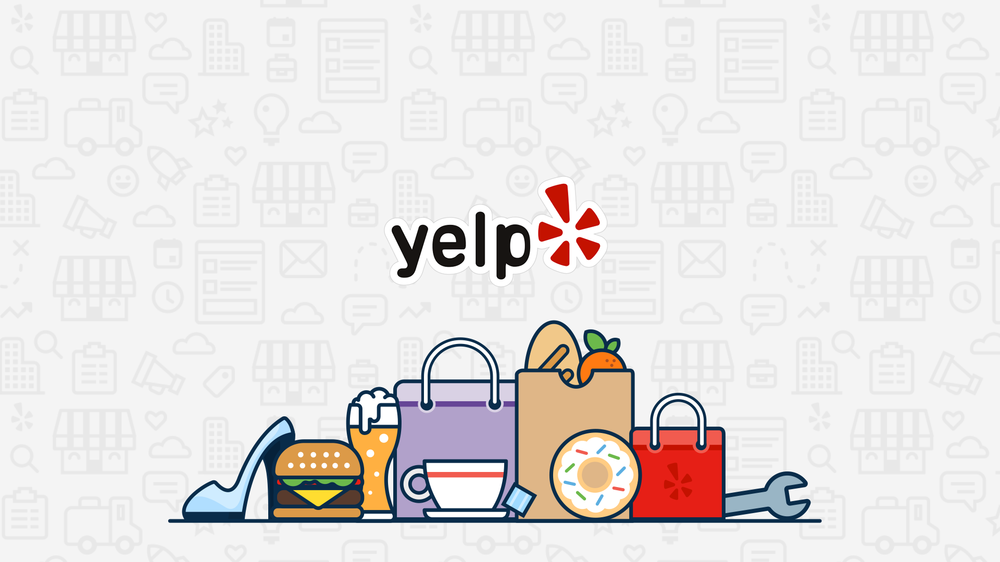

# Table of Contents:

1. Introduction
2. Importing Libraries
3. Rating Distribution
4. Map Visualization
   1. Global View
   2. North America and Europe Region
   3. City View (Las Vegas, Phoenix, Stuttgart, Edinburgh)
   4. Ratings in Las Vegas
5. In-Depth Analysis of Reviews
   1. Top 10 Review Users
   2. Tracking Top Users
   3. User Summary Statistics
6. Registration Data
7. User Network (Graph)
   1. Global Graph
   2. Subgraph - Stuttgart Region
8. Network Visualization:
   1. Spring Layout
   2. Circular/Circos Layout
   3. Random Layout
   4. Kamada-Kawai Layout
9. Community Detection

## Introduction
Yelp is a company that provides crowdsourced reviews and online booking services for local businesses. It was founded in 2004 by former employees of PayPal. Yelp allows users to rate and review various types of local businesses, including restaurants, cafes, hotels, shops, etc. Users can find and learn about the reviews and ratings of these businesses on Yelp, helping them make more informed consumer decisions.

The Yelp review dataset is a collection of rich review information collected from the Yelp platform, including ratings, review text, user information, business information, etc. By analyzing these data, we can gain insights into how users rate and review different types of businesses, and extract valuable information such as user preferences, strengths, and weaknesses of businesses. This, in turn, can provide targeted recommendations and suggestions for local businesses and users.

The aim of this project is to analyze the Yelp review dataset, explore trends, patterns, and correlations within the data, and extract valuable information through visualization, statistics, and network analysis. By conducting such data analysis, we can gain deeper insights into user behavior, business situations, social networks, and other aspects of the Yelp review dataset, thus providing better services and recommendations for the Yelp platform and users.

## Import

In [2]:
!pip install cartopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 26.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 5.3 MB/s eta 0:00:00
  Created wheel for cartopy: filename=Cartopy-0.21.1-cp310-cp310-linux_x86_64.whl size=11080589 sha256=0ed14e55b4f658c2becde18cc6901744da6d8c89b26c54b1bbd3143505265f9e
  Stored in directory: /root/.cache/pip/wheels/30/b0/1a/1c1909e00c76653dc4e2ff48555257c0eb2d1698280c8d9955
Successfully built cartopy


In [3]:
!apt-get install libgeos-dev
!pip install pyproj

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgeos-dev is already the newest version (3.10.2-1).
libgeos-dev set to manually installed.
0 upgraded, 0 newly installed, 0 to remove and 8 not upgraded.


In [6]:
!pip install basemap
!pip install basemap-data

In [5]:
## Import Basic Packages
import numpy as np
import pandas as pd

# Import Miscellaneous Packages
import gc  # Garbage Collector, used for memory management
import time  # Time module, used for timing operations
import warnings  # Warnings handling module, used for filtering warning messages

# Import Data Visualization Packages
import matplotlib.pyplot as plt  # Matplotlib plotting library, used for static visualizations
import seaborn as sns  # Seaborn plotting library, used for statistical visualizations
import matplotlib.gridspec as gridspec  # Matplotlib gridspec library, used for creating complex layouts
import plotly.offline as pyo  # Plotly offline plotting library, used for interactive visualizations
from plotly.graph_objs import *  # Plotly plotting library, used for interactive visualizations
import plotly.graph_objs as go  # Plotly plotting library, used for interactive visualizations

# Import Map-related Packages
import imageio  # Image processing library, used for handling map images
import folium  # Folium map library, used for creating interactive maps
import folium.plugins as plugins  # Folium plugins library, used for adding map plugins
from mpl_toolkits.basemap import Basemap  # Basemap library, used for drawing maps
# import cartopy.crs as ccrs  # (If needed, uncomment this line) Cartopy CRS library, used for map projections

# Import Graph Network-related Packages
import networkx as nx  # NetworkX graph network library, used for building and analyzing graph networks
import heapq  # Heap queue module, used for getting the top n elements from a list or dictionary

# Settings
start_time = time.time()  # Get the start time for timing purposes
color = sns.color_palette()  # Set the color palette for seaborn
sns.set_style("darkgrid")  # Set the plotting style for Seaborn
warnings.filterwarnings("ignore")  # Ignore warning messages
pyo.init_notebook_mode()  # Initialize Plotly's notebook mode for displaying interactive plots in Jupyter Notebook


### `yelp_tip.csv`❤

It is a dataset containing Yelp users' tips posted on business pages. The dataset typically includes the following fields:

1. `user_id`: User ID of the user submitting the tip.
2. `business_id`: Business ID of the business receiving the tip.
3. `text`: Text content of the tip.
4. `date`: Date and time when the tip was submitted.
5. `compliment_count`: Number of compliments received for the tip.
6. `type`: Type of data entry, usually "tip" indicating a tip.
7. `cool`: "Cool" vote count given by users for the tip.
8. `funny`: "Funny" vote count given by users for the tip.
9. `useful`: "Useful" vote count given by users for the tip.

These fields provide information about Yelp users' tips posted on business pages, including user IDs, business IDs, tip text content, submission date, the number of compliments received for the tip, and user vote counts for the tip's "cool," "funny," and "useful" attributes. This data can be used to explore user behavior and interactions on Yelp, understand user evaluations and feedback for businesses, and help businesses and the Yelp platform make improvements and optimizations.


### `yelp_business.csv`❤

It is a dataset containing Yelp business information, including the following fields:

1. `business_id`: Unique identifier for the business.
2. `name`: Name of the business.
3. `address`: Address of the business.
4. `city`: City where the business is located.
5. `state`: State or province where the business is located.
6. `postal_code`: Postal code of the business.
7. `latitude`: Latitude of the business location.
8. `longitude`: Longitude of the business location.
9. `stars`: Rating of the business (an integer between 1 and 5).
10. `review_count`: Number of reviews for the business.
11. `is_open`: Whether the business is open (0 for closed, 1 for open).
12. `categories`: Categories of the business, usually separated by commas.
13. `attributes`: Other attribute information about the business, typically in key-value pairs.
14. `hours`: Business hours information, typically in key-value pairs.

These fields provide basic information about Yelp businesses, including the business name, address, location coordinates, rating, review count, open status, categories, attributes, and hours of operation. This data can be used to analyze business performance on Yelp, compare differences and similarities between businesses, conduct geographical analysis, and gain insights into the Yelp business ecosystem and consumer behavior.

### `yelp_business_hours.csv`❤

It is a dataset containing Yelp business hours information, including the following fields:

1. `business_id`: Unique identifier for the business, corresponding to the `business_id` field in `yelp_business.csv`.
2. `monday`: Business hours on Monday.
3. `tuesday`: Business hours on Tuesday.
4. `wednesday`: Business hours on Wednesday.
5. `thursday`: Business hours on Thursday.
6. `friday`: Business hours on Friday.
7. `saturday`: Business hours on Saturday.
8. `sunday`: Business hours on Sunday.

Business hours are typically represented in hours, e.g., "9:00-17:00" indicates the business hours from 9:00 AM to 5:00 PM. Fields where business hours are not specified typically contain empty values.

These fields provide information about business hours for each day of the week for Yelp businesses. It can be used to analyze business operation patterns, compare business hours between different businesses, and analyze consumer activities within specific time intervals. These data can be combined with other business information from the `yelp_business.csv` dataset to gain a more comprehensive understanding of business operations.

### `yelp_checkin.csv`❤

It is a dataset containing Yelp user check-in information, including the following fields:

1. `business_id`: Unique identifier for the business, corresponding to the `business_id` field in `yelp_business.csv`.
2. `date`: Date when the user checked in, in the format "YYYY-MM-DD".
3. `time`: Time when the user checked in, in the format "HH:MM:SS".

This dataset records the date and time when Yelp users checked in at businesses. It can be used to analyze user check-in activity, check-in time distribution, and user check-in patterns at different businesses, helping businesses gain insights into user behavior and optimize their operational strategies.

These data can be combined with other business information from the `yelp_business.csv` dataset to gain a more comprehensive understanding of user check-ins at businesses and support data-driven business decisions.

### `yelp_user.csv`❤

It is a dataset containing Yelp user information, including the following fields:

1. `user_id`: Unique identifier for the user.
2. `name`: Nickname or username of the user.
3. `review_count`: Number of reviews posted by the user.
4. `yelping_since`: Date when the user joined Yelp, in the format "YYYY-MM-DD".
5. `friends`: List of user IDs representing the user's friends, separated by commas.
6. `useful`: Number of times the user's content has been marked as "useful" by other users.
7. `funny`: Number of times the user's content has been marked as "funny" by other users.
8. `cool`: Number of times the user's content has been marked as "cool" by other users.
9. `fans`: Number of fans following the user.
10. `elite`: User's elite status, indicating whether the user has been a Yelp Elite member, along with specific years.
11. `average_stars`: User's average rating.
12. `compliment_hot`: Number of times the user has received compliments for being "hot."
13. `compliment_more`: Number of times the user has received compliments for being "more."
14. `compliment_profile`: Number of times the user has received compliments for their "profile."
15. `compliment_cute`: Number of times the user has received compliments for being "cute."
16. `compliment_list`: Number of times the user has received compliments for their "list."
17. `compliment_note`: Number of times the user has received compliments for their "note."
18. `compliment_plain`: Number of times the user has received compliments for being "plain."
19. `compliment_cool`: Number of times the user has received compliments for being "cool."
20. `compliment_funny`: Number of times the user has received compliments for being "funny."
21. `compliment_writer`: Number of times the user has received compliments for being a "writer."
22. `compliment_photos`: Number of times the user has received compliments for their "photos."

These fields provide information about Yelp users, including user IDs, usernames, the number of reviews posted, the date of joining Yelp, friends list, content vote counts (useful, funny, cool), fans count, elite status, average rating, and various compliment counts received. This data can be used to analyze user activity on Yelp, explore user registration behavior, and help businesses understand user behavior and preferences, supporting data-driven decisions.

These data can also be combined with other

 business information from the `yelp_business.csv` dataset to gain a more comprehensive understanding of user interactions with businesses and to help businesses tailor their strategies to better serve their customers.

In [7]:
from google.colab import drive

# Connect to Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
import pandas as pd

# Define file paths
file_path = '/content/drive/My Drive/of-ds/项目/yelp/data/'

# Import yelp_business.csv dataset
business = pd.read_csv(file_path + "yelp_business.csv")  # Use pd.read_csv() function to read data from the CSV file

# Import yelp_business_hours.csv dataset
business_hours = pd.read_csv(file_path + "yelp_business_hours.csv")

# Import yelp_checkin.csv dataset
check_in = pd.read_csv(file_path + "yelp_checkin.csv")

# Import yelp_review.csv dataset
reviews = pd.read_csv(file_path + "yelp_review.csv")

# Import yelp_tip.csv dataset
tip = pd.read_csv(file_path + "yelp_tip.csv")

# Import yelp_user.csv dataset
user = pd.read_csv(file_path + "yelp_user.csv")


In [9]:
business.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,4.0,22,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,3.0,11,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1.5,18,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,3.0,9,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,3.5,116,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


### Rating Distribution

The following code uses the `barplot()` function from the Seaborn library to create a bar plot, illustrating the distribution of businesses across different star ratings.

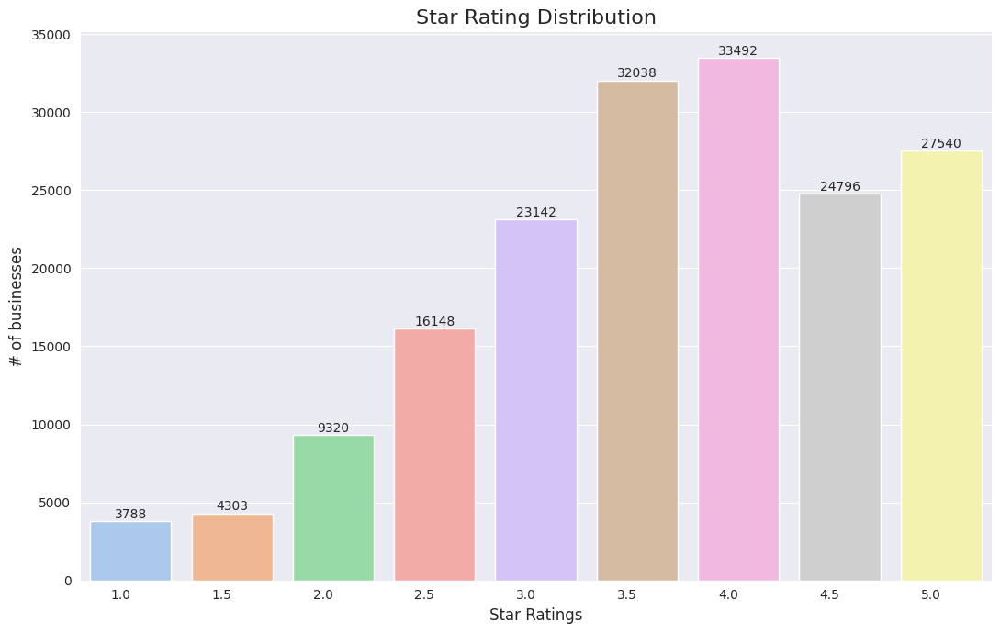

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the distribution of star ratings
x = business['stars'].value_counts().sort_index()  # Use value_counts() to get the count of each star rating and sort by index

# Create a bar plot
plt.figure(figsize=(11, 7))  # Set the figure size
colors = sns.color_palette('pastel')  # Choose a color palette for the bars
ax = sns.barplot(x=x.index, y=x.values, palette=colors)  # Use the barplot function with the chosen color palette
plt.title("Star Rating Distribution", fontsize=16)  # Set the title of the plot and increase font size
plt.ylabel('# of businesses', fontsize=12)  # Set the y-axis label and font size
plt.xlabel('Star Ratings', fontsize=12)  # Set the x-axis label and font size

# Add label text and increase font size
for rect, label in zip(ax.patches, x.values):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 5, label, ha='center', va='bottom', fontsize=10)

# Rotate x-axis labels and increase font size
plt.xticks(rotation=0, ha='right', fontsize=10)

# Adjust figure padding
plt.tight_layout()

plt.show()  # Display the plot



In [11]:
import plotly.io as pio
pio.renderers.default = 'colab'

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Get the distribution of star ratings
x = business['stars'].value_counts().sort_index()

# Create a color list
colors = np.where(x.values == x.values.max(), '#ff0000', np.where(x.values == x.values.min(), '#0095ff', '#19c37d'))

# Create bar chart data
data = [
    go.Bar(
        x=x.index,
        y=x.values,
        text=x.values,
        textposition='auto',
        marker=dict(
            color=colors,  # Set colors based on the highest and lowest counts
            line=dict(
                color='rgba(50, 171, 96, 1.0)',  # Set bar chart border color
                width=1.5
            )
        )
    )
]

# Create layout
layout = go.Layout(
    title="Star Rating Distribution",
    xaxis=dict(
        title="Star Ratings",
        tickmode='linear',
        tick0=1,
        dtick=0.5
    ),
    yaxis=dict(title="# of businesses")
)

# Create figure object
fig = go.Figure(data=data, layout=layout)

# Display the plot
fig.show(renderer='colab')


*The following code uses the barplot() function from the Seaborn library to create a bar plot, displaying the distribution of popular business categories and their corresponding quantities on Yelp.*

There are 59106 different business types/categories on Yelp!


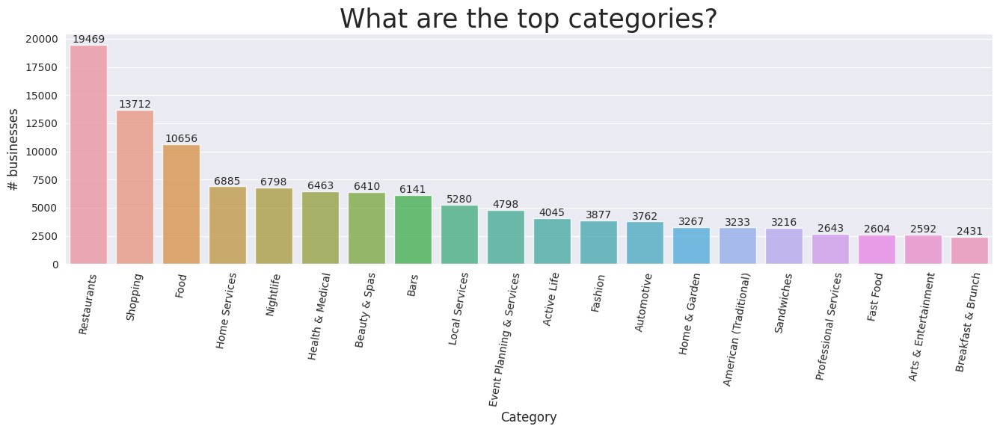

In [12]:
# Obtaining all business categories
business_cats = ' '.join(business['categories'])  # Concatenate all business categories into a single string

# Splitting business categories into individual categories and storing them in a DataFrame
cats = pd.DataFrame(business_cats.split(';'), columns=['category'])  # Splitting business categories using semicolon and creating a DataFrame
x = cats.category.value_counts()  # Using the value_counts() function to get the count of each category
print("There are", len(x), "different business types/categories on Yelp!")  # Outputting the number of distinct business categories

# Preparing data for plotting the bar chart
x = x.sort_values(ascending=False)  # Sort the count values in descending order
x = x.iloc[0:20]  # Only take the top 20 categories for plotting the chart

# Creating the bar chart
plt.figure(figsize=(16, 4))  # Set the figure size
ax = sns.barplot(x=x.index, y=x.values, alpha=0.8)  # Using the barplot function from the Seaborn library to create the bar chart
plt.title("What are the top categories?", fontsize=25)  # Set the title of the plot
locs, labels = plt.xticks()  # Get the x-axis tick positions and labels
plt.setp(labels, rotation=80)  # Set the rotation angle for x-axis labels
plt.ylabel('# businesses', fontsize=12)  # Set the y-axis label
plt.xlabel('Category', fontsize=12)  # Set the x-axis label

# Add label text
rects = ax.patches  # Get the rectangle objects of the bars
labels = x.values  # Get the count values
for rect, label in zip(rects, labels):  # Iterate through the rectangle objects and count values
    height = rect.get_height()  # Get the height of the rectangle
    ax.text(rect.get_x() + rect.get_width() / 2, height + 5, label, ha='center', va='bottom')  # Add text label above each bar

plt.show()  # Display the plot


*In the modified version below, the bar chart is now displayed vertically, making it easier to understand the distribution of the top business categories on Yelp. The x-axis represents the number of businesses, and the y-axis represents the categories. The text labels are placed to the right of each bar for better visibility. Let's take a look!🤪*

There are 59106 different business types/categories on Yelp!


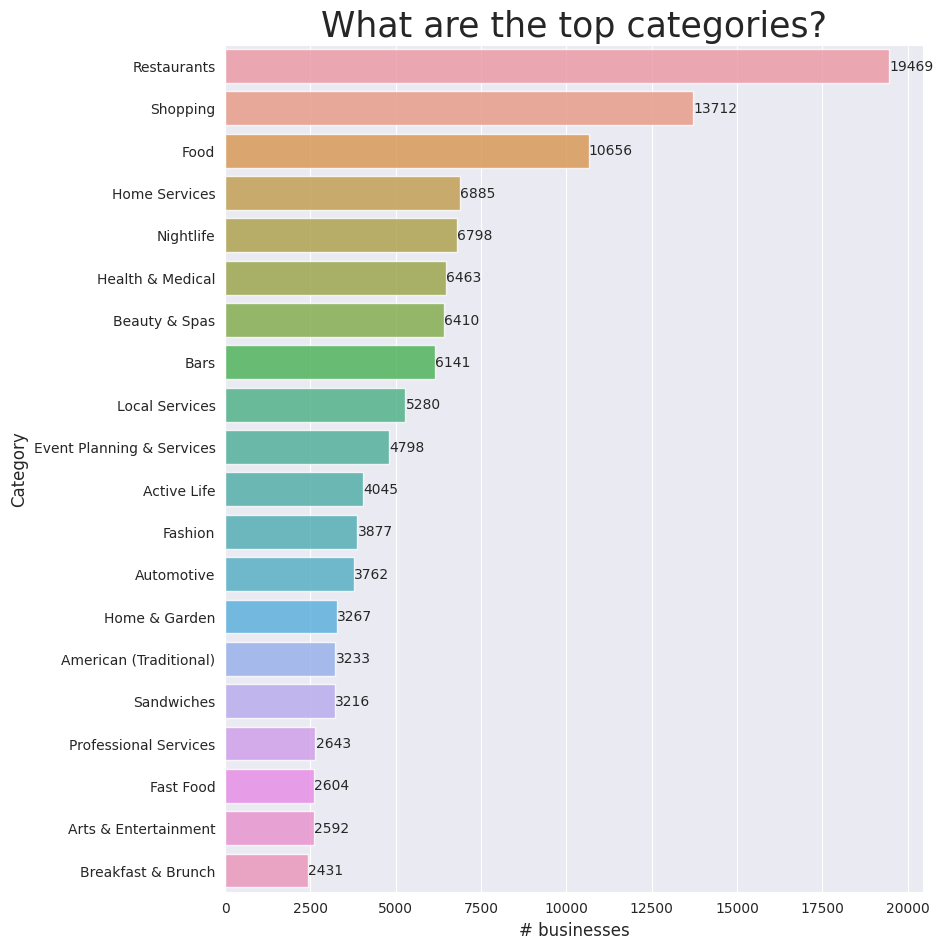

In [13]:
# Obtaining all business categories
business_cats = ' '.join(business['categories'])  # Concatenate all business categories into a single string

# Splitting business categories into individual categories and storing them in a DataFrame
cats = pd.DataFrame(business_cats.split(';'), columns=['category'])  # Splitting business categories using semicolon and creating a DataFrame
y = cats.category.value_counts()  # Using the value_counts() function to get the count of each category
print("There are", len(y), "different business types/categories on Yelp!")  # Outputting the number of distinct business categories

# Preparing data for plotting the bar chart
y = y.sort_values(ascending=False)  # Sort the count values in descending order
y = y.iloc[0:20]  # Only take the top 20 categories for plotting the chart

# Creating the bar chart
plt.figure(figsize=(9, 11))  # Set the figure size
ax = sns.barplot(x=y.values, y=y.index, alpha=0.8)  # Using the barplot function from the Seaborn library to create the bar chart
plt.title("What are the top categories?", fontsize=25)  # Set the title of the plot
plt.xlabel('# businesses', fontsize=12)  # Set the x-axis label
plt.ylabel('Category', fontsize=12)  # Set the y-axis label

# Add label text
rects = ax.patches  # Get the rectangle objects of the bars
labels = y.values  # Get the count values
for rect, label in zip(rects, labels):  # Iterate through the rectangle objects and count values
    width = rect.get_width()  # Get the width of the rectangle
    ax.text(width + 5, rect.get_y() + rect.get_height() / 2, label, ha='left', va='center')  # Add text label to the right of each bar

plt.show()  # Display the plot

In [15]:
import plotly.graph_objects as go

# Obtaining all business categories
business_cats = ' '.join(business['categories'])  # Concatenate all business categories into a single string

# Splitting business categories into individual categories and storing them in a DataFrame
cats = pd.DataFrame(business_cats.split(';'), columns=['category'])  # Splitting business categories using semicolon and creating a DataFrame
x = cats.category.value_counts()  # Using the value_counts() function to get the count of each category
print("There are", len(x), "different business types/categories on Yelp!")  # Outputting the number of distinct business categories

# Preparing data for plotting the horizontal bar chart
x = x.sort_values(ascending=False)  # Sort the count values in descending order
x = x.iloc[0:20]  # Only take the top 20 categories for plotting the chart

# Creating data for the horizontal bar chart
data = [
    go.Bar(
        y=x.index,
        x=x.values,
        text=x.values,
        textposition='auto',
        orientation='h',  # Set to horizontal orientation
        marker=dict(
            color='rgb(148, 200, 258)',  # Set the bar chart color
            line=dict(
                color='rgb(8, 48, 107)',  # Set the bar chart border color
                width=1.5
            )
        )
    )
]

# Creating layout
layout = go.Layout(
    title="Top 20 Business Categories on Yelp",
    yaxis=dict(
        title="Category"
    ),
    xaxis=dict(title="Number of Businesses")
)

# Creating the figure object
fig = go.Figure(data=data, layout=layout)

# Display the plot
fig.show()

There are 59106 different business types/categories on Yelp!


In [16]:
import plotly.graph_objects as go

# Obtaining all business categories
business_cats = ' '.join(business['categories'])  # Concatenate all business categories into a single string

# Splitting business categories into individual categories and storing them in a DataFrame
cats = pd.DataFrame(business_cats.split(';'), columns=['category'])  # Splitting business categories using semicolon and creating a DataFrame
x = cats.category.value_counts()  # Using the value_counts() function to get the count of each category
print("There are", len(x), "different business types/categories on Yelp!")  # Outputting the number of distinct business categories

# Preparing data for plotting the horizontal bar chart
x = x.sort_values(ascending=False)  # Sort the count values in descending order
x = x.iloc[0:20]  # Only take the top 20 categories for plotting the chart

# Creating data for the horizontal bar chart
bar_data = [
    go.Bar(
        y=x.index,
        x=x.values,
        text=x.values,
        textposition='auto',
        orientation='h',  # Set to horizontal orientation
        marker=dict(
            color='rgb(148,200,258)',  # Set the bar chart color
            line=dict(
                color='rgb(8, 48, 107)',  # Set the bar chart border color
                width=1.5
            )
        ),
        name='Count'
    )
]

# Creating data for the line chart
line_data = [
    go.Scatter(
        x=x.values,
        y=x.index,
        mode='lines+markers',
        line=dict(
            color='red',  # Set the line chart color
            width=2
        ),
        name='Count Trend'
    )
]

# Creating layout
layout = go.Layout(
    title="What are the top categories?",
    yaxis=dict(
        title="Category"
    ),
    xaxis=dict(title="Number of Businesses"),
    barmode='group'
)

# Creating the figure object
fig = go.Figure(data=[*bar_data, *line_data], layout=layout)

# Display the plot
fig.show()

There are 59106 different business types/categories on Yelp!


## Map Section

### Analysis of Review Source Locations

In this map section, we analyze the `geographical locations` of various `businesses`.

1. First, we examine the `global view` of Yelp businesses.
2. Then, we zoom in on the two most `concentrated regions` (North America and Europe).
3. Explore the `cities with the most reviews`.
4. Visualize the top `two ranked` cities.

### Global View

*Explanation: In this code snippet, we use the Matplotlib and Basemap libraries to create a basic world map. First, we import the necessary libraries. Then, we create an image window with a specified size. Next, we use an orthographic projection to generate a globe-like version of the map. We fill the continents and oceans with specified color codes. Then, we draw the country borders and use scatter plots to mark the latitude and longitude positions of the businesses on the map. Finally, we add a title to the map and display it.*

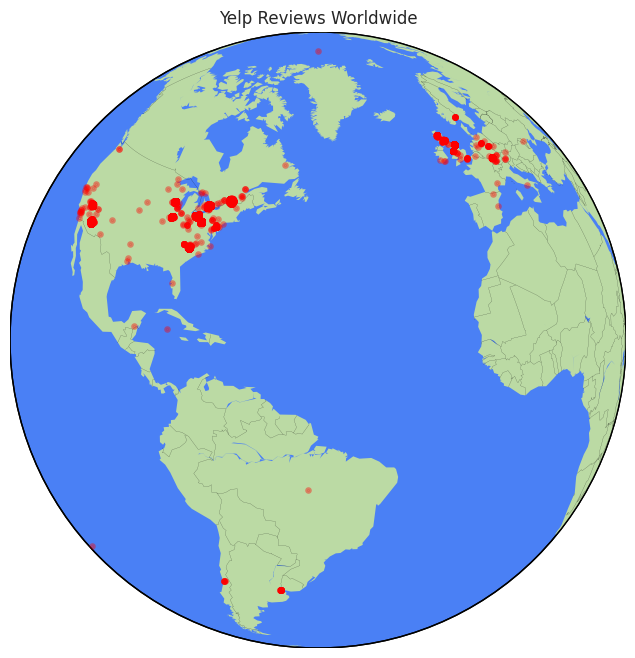

In [17]:
# Import the necessary libraries
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Create an image window with a specified size
plt.figure(1, figsize=(18, 8))

# Generate a globe-like version of the map using an orthographic projection
m1 = Basemap(projection='ortho', lat_0=20, lon_0=-50)

# Fill continents and oceans with specified color codes
m1.fillcontinents(color='#bbdaa4', lake_color='#4a80f5')

# Add ocean boundaries with a specified color
m1.drawmapboundary(fill_color='#4a80f5')

# Draw country borders and set line width and color
m1.drawcountries(linewidth=0.1, color="black")

# Use a scatter plot to mark the latitude and longitude positions of the businesses on the map
mxy = m1(business["longitude"].tolist(), business["latitude"].tolist())
m1.scatter(mxy[0], mxy[1], s=3, c="red", lw=3, alpha=0.4, zorder=5)

# Add a title to the map
plt.title("Yelp Reviews Worldwide")

# Display the map
plt.show()


### North America and Europe Regions

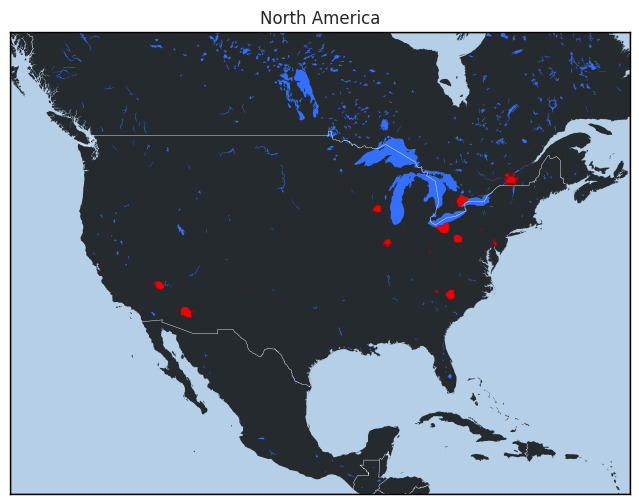

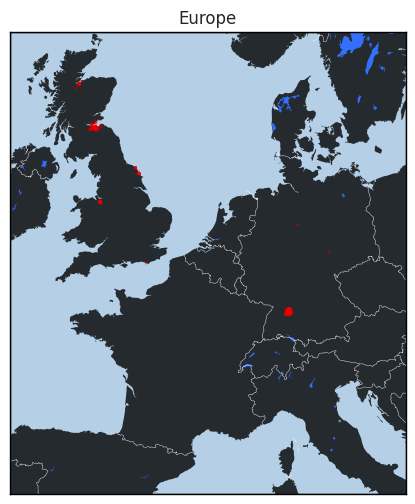

In [18]:
# Filtering Data for North America Region
lon_min, lon_max = -132.714844, -59.589844
lat_min, lat_max = 13.976715, 56.395664

# Creating the selector
idx_NA = (business["longitude"] > lon_min) & \
         (business["longitude"] < lon_max) & \
         (business["latitude"] > lat_min) & \
         (business["latitude"] < lat_max)
# Applying the selector to filter the subset
NA_business = business[idx_NA]

# Initializing the plot
plt.figure(figsize=(12, 6))
m2 = Basemap(projection='merc',
             llcrnrlat=lat_min,
             urcrnrlat=lat_max,
             llcrnrlon=lon_min,
             urcrnrlon=lon_max,
             lat_ts=35,
             resolution='i')

m2.fillcontinents(color='#252a2f', lake_color='#3370ff')  # Dark gray land, blue lakes
m2.drawmapboundary(fill_color='#b5d0e6')  # Light Blue background
m2.drawcountries(linewidth=0.3, color="w")  # White lines indicating country boundaries

# Plotting the data
mxy = m2(NA_business["longitude"].tolist(), NA_business["latitude"].tolist())
m2.scatter(mxy[0], mxy[1], s=5, c="red", lw=0, alpha=0.05, zorder=5)

plt.title("North America")

# Filtering Data for Europe Region
lon_min, lon_max = -8.613281, 16.699219
lat_min, lat_max = 40.488737, 59.204064

# Creating the selector
idx_euro = (business["longitude"] > lon_min) & \
           (business["longitude"] < lon_max) & \
           (business["latitude"] > lat_min) & \
           (business["latitude"] < lat_max)
# Applying the selector to filter the subset
euro_business = business[idx_euro]

# Initializing the plot
plt.figure(figsize=(12, 6))
m3 = Basemap(projection='merc',
             llcrnrlat=lat_min,
             urcrnrlat=lat_max,
             llcrnrlon=lon_min,
             urcrnrlon=lon_max,
             lat_ts=35,
             resolution='i')

m3.fillcontinents(color='#252a2f', lake_color='#3370ff')  # Dark gray land, blue lakes
m3.drawmapboundary(fill_color='#b5d0e6')  # Light Blue background
m3.drawcountries(linewidth=0.3, color="w")  # White lines indicating country boundaries

# Plotting the data
mxy = m3(euro_business["longitude"].tolist(), euro_business["latitude"].tolist())
m3.scatter(mxy[0], mxy[1], s=5, c="red", lw=0, alpha=0.05, zorder=5)

plt.title("Europe")
plt.show()

### City Perspectives (Las Vegas, Phoenix, Stuttgart, Edinburgh)

Next, we gain insights into the appearance of four cities (Las Vegas, Phoenix, Stuttgart, Edinburgh) by plotting their latitude and longitude on the map.

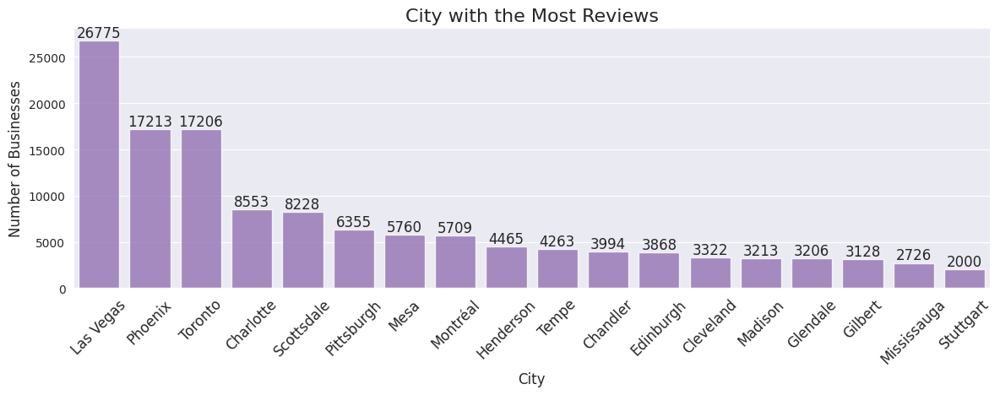

In [20]:
# Get the number of reviews for each city
x = business['city'].value_counts()
x = x.sort_values(ascending=False)
x = x.iloc[0:18]

# Plot the bar chart
plt.figure(figsize=(14,4))
ax = sns.barplot(x = x.index, y = x.values, alpha=0.8, color=color[4]) # Set the color to color[3]
plt.title("City with the Most Reviews", fontsize=16) # Set the title and font size
plt.xticks(rotation=45, fontsize=12) # Set the rotation angle and font size of X-axis labels
plt.ylabel('Number of Businesses', fontsize=12) # Set the Y-axis label and font size
plt.xlabel('City', fontsize=12) # Set the X-axis label and font size

rects = ax.patches # Get the rectangle objects of the bars
labels = x.values # Get the numeric labels above each bar

# Add numeric labels above each bar
for rect, label in zip(rects, labels):
    height = rect.get_height() # Get the height of the bar
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize=12) # Add the numeric label with specified position, alignment, and font size

plt.show() # Display the bar chart

In [22]:
import plotly.graph_objects as go

# Get the number of reviews for each city
x = business['city'].value_counts()
x = x.sort_values(ascending=False)
x = x.iloc[0:18]

# Create data for the bar chart
data = [
    go.Bar(
        x=x.index,
        y=x.values,
        marker=dict(
            color='rgb(0, 123, 255)',  # Set the bar chart color
        ),
        text=x.values,  # Set text annotation content
        textposition='auto',  # Automatically choose text position
        textfont=dict(
            size=12,  # Set the text annotation font size
        ),
    )
]

# Create layout
layout = go.Layout(
    title="City with the Most Reviews",
    xaxis=dict(
        title="City",
        tickangle=45,  # Set X-axis label rotation angle
        tickfont=dict(
            size=12,  # Set X-axis label font size
        ),
    ),
    yaxis=dict(
        title="Number of Businesses",
        titlefont=dict(
            size=12,  # Set Y-axis label font size
        ),
        tickfont=dict(
            size=12,  # Set Y-axis tick font size
        ),
    ),
)

# Create figure object
fig = go.Figure(data=data, layout=layout)

# Display the plot
fig.show()


In [21]:
# Get all the rating data
rating_data = business[['latitude', 'longitude', 'stars', 'review_count']]
# Create a custom column 'popularity', calculated as the product of stars and review count
rating_data['popularity'] = rating_data['stars'] * rating_data['review_count']

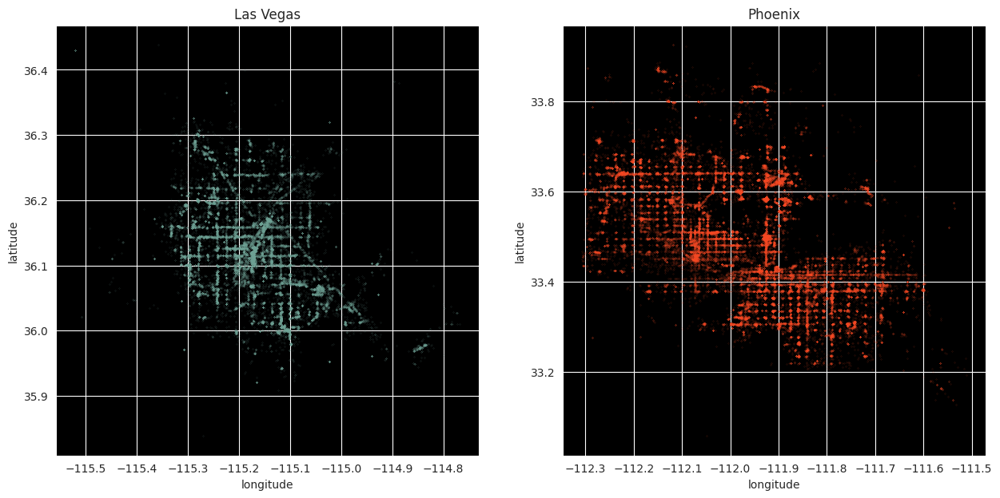

In [23]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))  # Create a canvas containing two subplots with a size of 15x7

# Las Vegas random point coordinates
lat = 36.207430
lon = -115.268460
# Adjust coordinates to get an appropriate image
lon_min, lon_max = lon - 0.3, lon + 0.5
lat_min, lat_max = lat - 0.4, lat + 0.5
# Filter the data for Las Vegas based on longitude and latitude range
ratings_data_vegas = rating_data[(rating_data["longitude"] > lon_min) &
                                (rating_data["longitude"] < lon_max) &
                                (rating_data["latitude"] > lat_min) &
                                (rating_data["latitude"] < lat_max)]

# Plot a scatter plot for Las Vegas
ratings_data_vegas.plot(kind='scatter', x='longitude', y='latitude',
                       color='#74a89b',
                       s=.02, alpha=.6, subplots=True, ax=ax1)
ax1.set_title("Las Vegas")  # Set the title for subplot 1
ax1.set_facecolor('black')  # Set the background color of subplot 1 to black

# Phoenix random point coordinates
lat = 33.435463
lon = -112.006989
# Adjust coordinates to get an appropriate image
lon_min, lon_max = lon - 0.3, lon + 0.5
lat_min, lat_max = lat - 0.4, lat + 0.5
# Filter the data for Phoenix based on longitude and latitude range
ratings_data_phoenix = rating_data[(rating_data["longitude"] > lon_min) &
                                  (rating_data["longitude"] < lon_max) &
                                  (rating_data["latitude"] > lat_min) &
                                  (rating_data["latitude"] < lat_max)]
# Plot a scatter plot for Phoenix
ratings_data_phoenix.plot(kind='scatter', x='longitude', y='latitude',
                         color='#fb4e29',
                         s=.02, alpha=.6, subplots=True, ax=ax2)
ax2.set_title("Phoenix")  # Set the title for subplot 2
ax2.set_facecolor('black')  # Set the background color of subplot 2 to black

f.show()  # Display the canvas


 Interesting observations reveal that American cities often exhibit regular grid-like street layouts, while other cities may showcase more fluid and irregular designs. By visualizing the locations of businesses on a map, we can gain deeper insights into the distribution of economic activities and the clustering of enterprises in different city areas. This approach offers an intuitive and captivating way to reveal spatial patterns and trends within urban regions, making it highly valuable for urban planning, policy-making, and business decisions. Through data visualization, we can delve into and understand the complex spatial relationships within city areas visually, thus enhancing our understanding of urban development and changes.

### Ratings in Las Vegas

Let's explore how people rate `different businesses in Vegas`.

Below is an `interactive animation` where we utilize the amazing Folium package to create stunning Leaflet map visualizations.

In this animation, we highlight businesses based on their star ratings.

The objective is to see if certain hotspots or concentrations have outstanding restaurants.

As it turns out, `both good and bad businesses are fairly evenly distributed throughout the city`.

`folium` is a library for creating interactive maps in Python, based on the Leaflet JavaScript library. It provides a straightforward interface for adding various map elements such as markers, heatmaps, polygons, circles, etc., and supports displaying data and adding pop-up windows on the map.

Below is an example code demonstrating how to create a simple map using `folium`:

```python
import folium

# Create a map object
m = folium.Map(location=[36.127430, -115.138460], zoom_start=11) # Specify the initial center coordinates and zoom level

# Add a marker on the map
folium.Marker(location=[36.127430, -115.138460], popup='Las Vegas').add_to(m) # Add a marker and set the content of the pop-up window

# Show the map
m
```


In [24]:
data = []
# Reorganize data to fit the format required by folium
stars_list = list(rating_data['stars'].unique())  # Get a list of unique star ratings
for star in stars_list:  # Iterate through the list of star ratings
    subset = ratings_data_vegas[ratings_data_vegas['stars'] == star]  # Filter the data subset based on the star rating
    data.append(subset[['latitude', 'longitude']].values.tolist())  # Convert latitude and longitude data to a list and add it to the data list

# Initialize the map's center coordinates and zoom level
lat = 36.127430
lon = -115.138460
zoom_start = 11
print("Vegas Review Heatmap Animation")  # Print the title

# Create a basic folium map
m = folium.Map(location=[lat, lon], tiles="OpenStreetMap", zoom_start=zoom_start)
# Use the HeatMapWithTime plugin to create a heatmap with dynamic changes over time
hm = plugins.HeatMapWithTime(data, max_opacity=0.3, auto_play=True, display_index=True, radius=7)
hm.add_to(m)  # Add the heatmap to the map
m  # Show the map



Vegas Review Heatmap Animation


In [25]:
end_time=time.time()
print("Took",end_time-start_time,"s")

Took 395.2342953681946 s


## Review Mining

Let's explore the top-ranked users based on the number of reviews they have given.

In [26]:
# Due to the large dataset with over a million users, we are sampling 100,000 records.

user_agg = reviews.sample(100000).groupby('user_id').agg(
            {'review_id': ['count'],
             'date': ['min', 'max'],
             'useful': ['sum'],
             'funny': ['sum'],
             'cool': ['sum'],
             'stars': ['mean']})

This code uses the Pandas library to group and aggregate the data frame named 'reviews' based on the 'user_id' column. It calculates various aggregation functions for each group.

Specifically, the 'groupby' method is used to group the data frame 'reviews' by the 'user_id' column. Then, the 'agg' method applies multiple aggregation functions to each group, including 'count', 'min', 'max', 'sum', 'mean', and others. It calculates the following metrics:

- 'review_id': 'count', which calculates the number of reviews for each user.
- 'date': 'min' and 'max', which respectively calculate the minimum and maximum review dates for each user.
- 'useful': 'sum', which calculates the total sum of the 'useful' column in each user's reviews.
- 'funny': 'sum', which calculates the total sum of the 'funny' column in each user's reviews.
- 'cool': 'sum', which calculates the total sum of the 'cool' column in each user's reviews.
- 'stars': 'mean', which calculates the average value of the 'stars' column in each user's reviews.

The aggregated results are saved in a new data frame named 'user_agg', which contains the computed values from each aggregation function. This allows for summarizing and analyzing the data for each user's reviews, facilitating further data analysis and visualization.

In [27]:
user_agg=user_agg.sort_values([('review_id','count')],ascending=False)
print("          Top 10 Users in Yelp")
user_agg.head(10)

          Top 10 Users in Yelp


review_id        date             useful funny cool  \
                           count         min         max    sum   sum  sum   
user_id                                                                      
CxDOIDnH8gp9KXzpBHJYXw        66  2009-11-09  2017-12-02    213    93  138   
DK57YibC5ShBmqQl97CKog        34  2006-09-02  2017-10-22    478   286  449   
bLbSNkLggFnqwNNzzq-Ijw        27  2014-05-01  2017-12-01    326   198  231   
hWDybu_KvYLSdEFzGrniTw        27  2009-06-09  2017-11-25    157   113  119   
ELcQDlf69kb-ihJfxZyL0A        25  2012-06-25  2017-12-09     42    24   19   
QJI9OSEn6ujRCtrX06vs1w        25  2010-06-25  2013-10-31    180    85  114   
Xxvz5g67eaCr3emnkY5M6w        24  2010-04-24  2017-08-10     60    17   25   
UYcmGbelzRa0Q6JqzLoguw        23  2011-02-03  2016-11-02    170    77  136   
PKEzKWv_FktMm2mGPjwd0Q        22  2010-10-31  2017-09-22    212    87  150   
0BBUmH7Krcax1RZgbH4fSA        21  2010-10-17  2017-01-10     82    36   37   

                           stars  
                            mean  
user_id                           
CxDOIDnH8gp9KXzpBHJYXw  3.242424  
DK57YibC5ShBmqQl97CKog  3.735294  
bLbSNkLggFnqwNNzzq-Ijw  3.370370  
hWDybu_KvYLSdEFzGrniTw  3.481481  
ELcQDlf69kb-ihJfxZyL0A  3.280000  
QJI9OSEn6ujRCtrX06vs1w  3.520000  
Xxvz5g67eaCr3emnkY5M6w  4.166667  
UYcmGbelzRa0Q6JqzLoguw  3.695652  
PKEzKWv_FktMm2mGPjwd0Q  3.545455  
0BBUmH7Krcax1RZgbH4fSA  3.000000

The reviews may represent randomly sampled data from all the reviews.

### Tracking High-Value Users

Let's track the top-ranking users from the review dataset.

To achieve this, we create a map that shows all the locations visited by a user in chronological order, and then we create an animated heat map from it.

In [28]:
# Tracking Top Users:
top_user_reviews = reviews[reviews['user_id'] == 'CxDOIDnH8gp9KXzpBHJYXw']
# Get location information for the reviews by the top user
top_user_locs = pd.merge(top_user_reviews, business, on='business_id')
# Get a list of unique dates for the reviews by the top user
date_list = list(top_user_locs['date'].unique())
# Reorganize the data to fit the format required by the Folium library
data = []
for date in date_list:
    subset = top_user_locs[top_user_locs['date'] == date]
    df = subset[['latitude', 'longitude', 'date']]
    data.append(subset[['latitude', 'longitude']].values.tolist())

In [29]:
# Initializing the Map, setting the initial location to Ontario, Canada, with latitude 43.860397 and longitude -79.303184, and initial zoom level of 9.
lat = 43.860397
lon = -79.303184
zoom_start = 9
print("                   Stalking the top User                    ")

# Creating a basic map object using Cartodb Positron tile style, setting the initial location and zoom level.
m = folium.Map(location=[lat, lon], tiles="Cartodb Positron", zoom_start=zoom_start)

# Creating a HeatMapWithTime object with a time slider, passing in the data and other parameters.
hm = plugins.HeatMapWithTime(data, max_opacity=0.3, auto_play=True, display_index=True)
hm.add_to(m) # Adding the HeatMapWithTime object to the map.
m # Displaying the map.

                   Stalking the top User                    


"Highest Rating with increasing Useful":

This regression plot shows the trend of the highest ratings (stars) as the number of useful markers in the reviews increases.

The x-axis represents the thresholds of useful markers, ranging from 100 to 1000 with intervals of 20;

The y-axis represents the corresponding highest ratings values for each threshold. The chart helps us understand the relationship between the number of useful markers and the highest ratings.

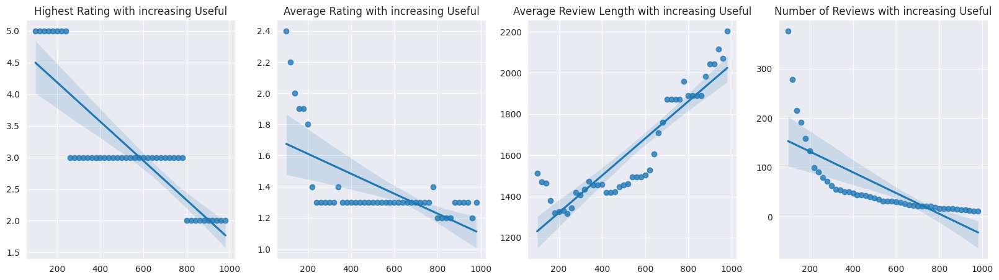

In [30]:
reviews = reviews.query('useful>0 and funny>0 and cool>0')

thresholds = [x for x in range(100,1000,20)]
max_star = [round(reviews.query('useful>@thres').stars.max(),1) for thres in thresholds]
avg_star = [round(reviews.query('useful>@thres').stars.mean(),1) for thres in thresholds]
avg_review_len = [reviews.query('useful>@thres')['text'].agg(lambda x: len(x)).agg('mean') for thres in thresholds]
n_review = [reviews.query('useful>@thres').stars.count() for thres in thresholds]

fig, axes = plt.subplots(1, 4, figsize = [20,5])
sns.regplot(x=thresholds, y=max_star,ax = axes[0])
axes[0].title.set_text('Highest Rating with increasing Useful')

sns.regplot(x=thresholds, y=avg_star,ax = axes[1])
axes[1].title.set_text('Average Rating with increasing Useful')

sns.regplot(x=thresholds, y=avg_review_len,ax = axes[2])
axes[2].title.set_text('Average Review Length with increasing Useful')

sns.regplot(x=thresholds, y=n_review,ax = axes[3])
axes[3].title.set_text('Number of Reviews with increasing Useful')

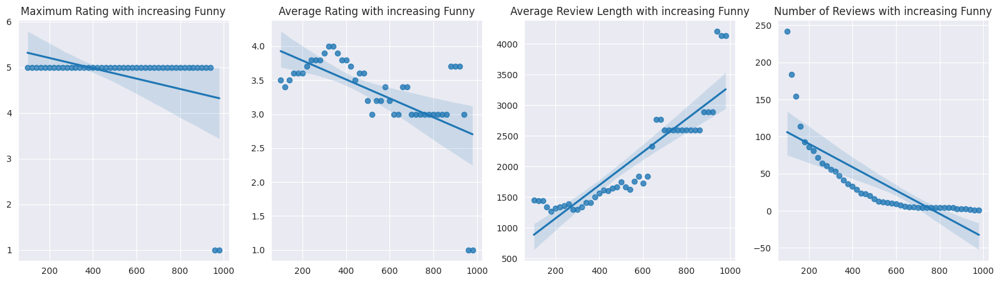

In [31]:
thresholds = [x for x in range(100,1000,20)]
max_star = [round(reviews.query('funny>@thres').stars.max(),1) for thres in thresholds]
avg_star = [round(reviews.query('funny>@thres').stars.mean(),1) for thres in thresholds]
avg_review_len = [reviews.query('funny>@thres')['text'].agg(lambda x: len(x)).agg('mean') for thres in thresholds]
n_review = [reviews.query('funny>@thres').stars.count() for thres in thresholds]

fig, axes = plt.subplots(1, 4, figsize = [20,5])
sns.regplot(x=thresholds, y=max_star,ax = axes[0])
axes[0].title.set_text('Maximum Rating with increasing Funny')

sns.regplot(x=thresholds, y=avg_star,ax = axes[1])
axes[1].title.set_text('Average Rating with increasing Funny')

sns.regplot(x=thresholds, y=avg_review_len,ax = axes[2])
axes[2].title.set_text('Average Review Length with increasing Funny')

sns.regplot(x=thresholds, y=n_review,ax = axes[3])
axes[3].title.set_text('Number of Reviews with increasing Funny')

###Sentiment Analysis

In [32]:
from textblob import TextBlob

Below is a simple TextBlob implementation example demonstrating how to perform basic text processing and sentiment analysis using TextBlob:

```python
from textblob import TextBlob

# Create a TextBlob object
text = "I love this product! It's amazing."
blob = TextBlob(text)

# Tokenization
words = blob.words
print("Tokenization result:", words)

# Part-of-speech tagging
tags = blob.tags
print("Part-of-speech tagging result:", tags)

# Noun phrase extraction
noun_phrases = blob.noun_phrases
print("Noun phrase extraction result:", noun_phrases)

# Sentiment analysis
sentiment = blob.sentiment
polarity = sentiment.polarity
subjectivity = sentiment.subjectivity
print("Sentiment analysis result:")
print("Polarity (ranging from -1 to 1, negative to positive):", polarity)
print("Subjectivity (ranging from 0 to 1, objective to subjective):", subjectivity)
```

This code first imports the TextBlob library and creates a TextBlob object 'blob' to represent the text for processing. Then, by calling methods of the TextBlob object such as 'words', 'tags', 'noun_phrases', and 'sentiment', it performs text processing and sentiment analysis tasks.

In this example, the input text is "I love this product! It's amazing." The TextBlob object 'blob' executes tokenization, part-of-speech tagging, noun phrase extraction, and sentiment analysis, and outputs the corresponding results.

In [33]:
elite_review_text = reviews.merge(user[user['elite'] != 'None']['user_id'])\
.query("date.str.startswith('2012')", engine='python')['text']
regular_review_text = reviews.merge(user[user['elite'] == 'None']['user_id'])\
.query("date.str.startswith('2012')", engine='python')['text']

In [34]:
%%time
elite_review_sentiment_score_2012 = elite_review_text.apply(lambda x: TextBlob(x).sentiment.polarity)

regular_review_sentiment_score_2012 = regular_review_text.apply(lambda x: TextBlob(x).sentiment.polarity)

CPU times: user 1min 42s, sys: 173 ms, total: 1min 42s
Wall time: 1min 57s


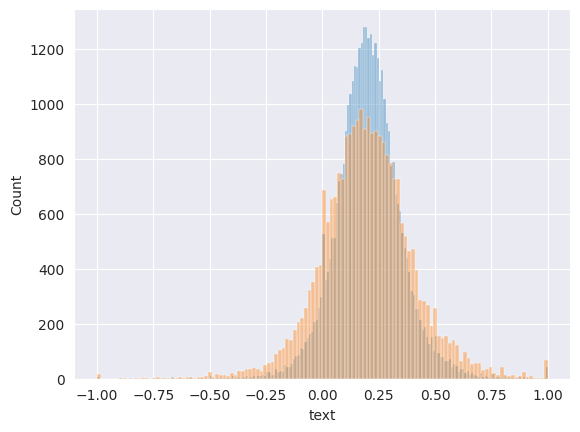

In [35]:
import seaborn as sns
ax1 = sns.histplot(elite_review_sentiment_score_2012, alpha = .4) #blue area refer the elite_review_sentiment
ax2 = sns.histplot(regular_review_sentiment_score_2012, alpha = .4) #orange area refer the regular_review_sentiment


In [36]:
def senti_word_cloud(s, max_words=200):
    import matplotlib
    from wordcloud import WordCloud
    matplotlib.rcParams['figure.figsize'] = (20, 10)
    # color_mask = imageio.imread("1.png")
    wc1 = WordCloud(background_color="black",  # Background color
                   max_words=max_words,  # Maximum number of words to display
                   #font_path="msyh.ttf",
                   width=1920, height=1080
                   )  # Image width

    wc2 = WordCloud(background_color="white",  # Background color
                   max_words=max_words,  # Maximum number of words to display
                  # font_path="msyh.ttf",
                   width=1920, height=1080
                   )  # Image width

    positivelist = []
    negativelist = []

    from textblob import TextBlob
    for each in s:
        each_word = TextBlob(each)
        feeling = each_word.sentiment.polarity
        if feeling > 0.25:
            positivelist.append(each)
        elif feeling < -0.25:
            negativelist.append(each)
        else:
            pass
    # Merge positive and negative lists into positive and negative strings, with words separated by spaces
    positive_string = " ".join(positivelist)
    negative_string = " ".join(negativelist)

    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    wc1.generate(negative_string)
    axes[0].imshow(wc1, interpolation='bilinear')
    axes[0].set_title('Negative')
    axes[0].axis('off')

    wc2.generate(positive_string)
    axes[1].imshow(wc2, interpolation='bilinear')
    axes[1].set_title('Positive')
    axes[1].axis('off')

    plt.show()


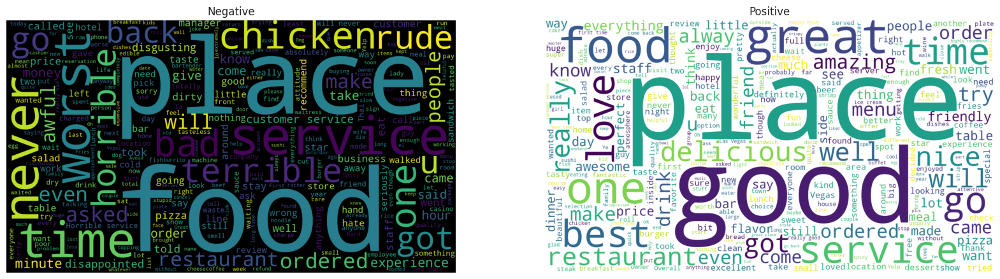

In [37]:
senti_word_cloud(reviews['text'].sample(20000),max_words = 300)

We conducted sentiment analysis on the comments of both elite users and regular users, and rated their overall polarity. It was observed that elite users tend to be more concentrated around a polarity score of 0.25, leaning towards positive sentiments.

Next, we analyzed the distribution of key words for comments with polarity scores exceeding 0.25 or below -0.25. We constructed word clouds to visualize these distributions.

## 5.3 User summary stats:

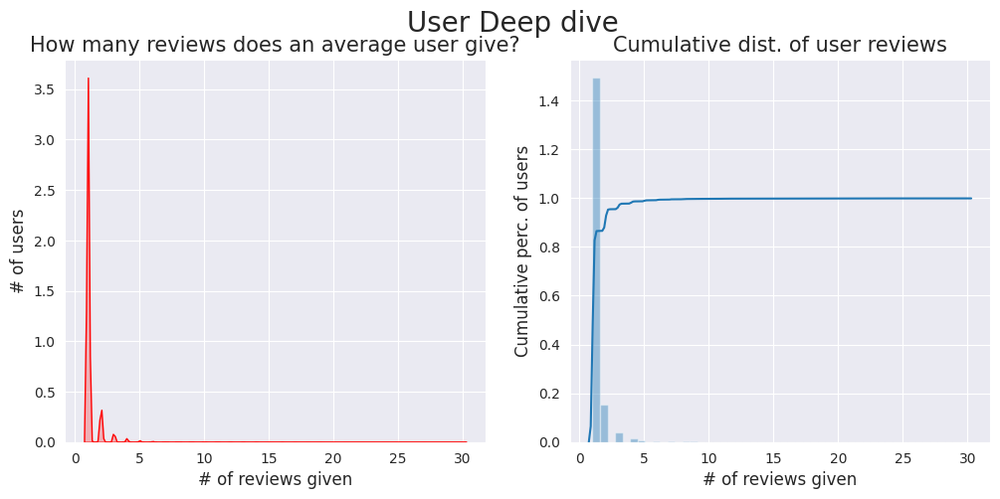

Took 781.0388760566711 s


In [38]:
# Cap max reviews to 30 for better visuals
user_agg[('review_id','count')].loc[user_agg[('review_id','count')]>30] = 30
plt.figure(figsize=(12,5))
plt.suptitle("User Deep dive",fontsize=20)
gridspec.GridSpec(1,2)
plt.subplot2grid((1,2),(0,0))
#Cumulative Distribution
ax=sns.kdeplot(user_agg[('review_id','count')],shade=True,color='r')
plt.title("How many reviews does an average user give?",fontsize=15)
plt.xlabel('# of reviews given', fontsize=12)
plt.ylabel('# of users', fontsize=12)

#Cumulative Distribution
plt.subplot2grid((1,2),(0,1))
sns.distplot(user_agg[('review_id','count')],
             kde_kws=dict(cumulative=True))
plt.title("Cumulative dist. of user reviews",fontsize=15)
plt.ylabel('Cumulative perc. of users', fontsize=12)
plt.xlabel('# of reviews given', fontsize=12)

plt.show()
end_time=time.time()
print("Took",end_time-start_time,"s")

~80% of the users write only about 2 reviews!

Only 10,000 data samples were used in here.

In [ ]:
gc.collect()
end_time=time.time()
print("Took",end_time-start_time,"s")

Took 23541.729270219803 s


##Registration Data


- `highlight_max` Function

The `highlight_max` function is a Python function used to highlight the maximum value in a pandas Series or DataFrame.

- Parameters

    - `data`: pandas Series or DataFrame - The data in which the maximum value needs to be highlighted.
    - `color`: Optional parameter - Specifies the color used to highlight the maximum value. Default is 'yellow'.

- How it works

    1. The function first creates a string `attr` that contains CSS style for setting the background color based on the `color` parameter.

    2. Then, it checks the dimension of the input data using the `data.ndim` attribute. If the dimension is 1, it means that `data` is a Series. The function proceeds by comparing each value in the Series with the maximum value using `data == data.max()`. This creates a boolean Series `is_max`, where positions with values equal to the maximum value are `True`, and others are `False`.

    3. Next, the function uses a list comprehension to create a list of CSS style strings for each value in `is_max`, where 'attr' is assigned when the value is 'True', and an empty string '' otherwise. This list of CSS style strings is returned as output.

    4. If the dimension of `data` is greater than 1, it means that `data` is a DataFrame. The function then uses `data.max().max()` to get the maximum value from the entire DataFrame. It creates a boolean DataFrame `is_max`, which has the same shape as `data`, where each element is `True` if it equals the maximum value, and `False` otherwise.

    5. Next, the function uses `np.where()` to create a new DataFrame, where the values corresponding to `True` in `is_max` are set to 'attr' (the CSS style string), and the values corresponding to `False` are set to an empty string ''. The resulting DataFrame has the same index and columns as `data`, and is returned as output.

In [39]:
def highlight_max(data, color='yellow'):
    '''
    highlight the maximum in a Series or DataFrame
    '''
    attr = 'background-color: {}'.format(color)
    if data.ndim == 1:  # Series from .apply(axis=0) or axis=1
        is_max = data == data.max()
        return [attr if v else '' for v in is_max]
    else:  # from .apply(axis=None)
        is_max = data == data.max().max()
        return pd.DataFrame(np.where(is_max, attr, ''),
                            index=data.index, columns=data.columns)

In [40]:
# Group the check-in data by 'weekday' and 'hour' and calculate the sum of 'checkins' in each group.
df = check_in.groupby(['weekday', 'hour'])['checkins'].sum()

# Reset the index and convert the grouped result to a DataFrame.
df = df.reset_index()

# Create a DataFrame with 'hour' as row index and 'weekday' as column index, and 'checkins' as the values.
df = df.pivot(index='hour', columns='weekday')[['checkins']]

# Remove the extra column level.
df.columns = df.columns.droplevel()

# Reset the row index.
df = df.reset_index()

# Process the 'hour' column and convert it to an integer type.
# Here, we use a lambda function and the split method to remove the minute part from the time string.
df.hour = df.hour.apply(lambda x: str(x).split(':')[0])
df.hour = df.hour.astype(int)

# Sort the DataFrame based on the values in the 'hour' column.
df = df.sort_values('hour')

# Rearrange the order of columns, with 'hour' column placed as the first column.
df = df[['hour', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']]

# Create a color map.
cm = sns.light_palette("orange", as_cmap=True)

# Use the custom function 'highlight_max' to highlight the maximum value in each column with blue color.
df.style.apply(highlight_max, color='#679bff', axis=0)


weekday,hour,Mon,Tue,Wed,Thu,Fri,Sat,Sun
0,0,163336,156195,166254,171669,178666,224425,225209
11,1,161168,162632,174696,181712,190371,245453,235295
16,2,140252,141732,153923,160906,169989,236195,224716
17,3,106422,103584,111840,117639,127783,189242,184979
18,4,73497,68950,72821,76283,86825,138952,140092
19,5,48253,42977,44109,42130,55672,97062,101133
20,6,31624,26646,27175,27108,36546,68465,72404
21,7,23022,18946,19195,20672,26551,49633,52890
22,8,15327,12452,12484,13830,18004,33591,35079
23,9,11000,8837,8814,10058,12683,21969,21524


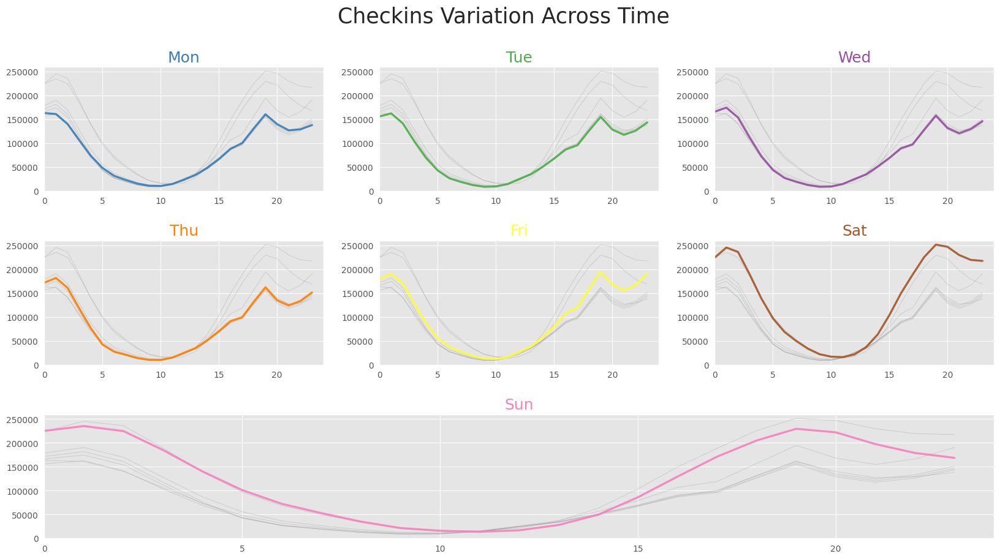

In [41]:
plt.style.use('ggplot')

# Set the plotting style to 'seaborn-darkgrid'.

# Create a color palette.
palette = plt.get_cmap('Set1')

# Create a figure with size (20, 10).
plt.figure(figsize=(20, 10))

# Add a main title.
plt.suptitle("Checkins Variation Across Time", fontsize=25)

# Create a 3x3 grid layout.
gridspec.GridSpec(3, 3)

# Adjust the vertical spacing between subplots.
plt.subplots_adjust(hspace=0.4)

# Loop to plot multiple line charts.
num = 0
for column in df.drop('hour', axis=1):
    num += 1
    # Find the position of the subplot.
    if num == 7:  # Adjust for the position of Sunday.
        plt.subplot2grid((3, 3), (2, 0), colspan=3)
    else:
        plt.subplot(3, 3, num)

    # Plot discrete grey lines to represent the trend of all groups.
    for v in df.drop('hour', axis=1):
        plt.plot(df['hour'], df[v], marker='', color='grey', linewidth=0.6, alpha=0.3)

    # Plot labeled line charts to represent the trend of specific groups.
    plt.plot(df['hour'], df[column], marker='', color=palette(num), linewidth=2.4, alpha=0.9, label=column)

    # Set the x-axis range.
    plt.xlim(0, 24)

    # Set the y-axis range.
    plt.ylim(-2, 260000)

    # Disable x-axis ticks for some subplots.
    if num in range(4):
        plt.tick_params(labelbottom='off')

    # Disable y-axis ticks for some subplots.
    if num not in [1, 4, 7]:
        plt.tick_params(labelleft='off')

    # Add subplot title.
    plt.title(column, loc='center', fontsize=18, fontweight=0, color=palette(num))


## User Network

The user table contains a list of users and their friends. Let's try to create a network using this data!

### Global Chart

In [42]:
# Filtering the subset of users who have at least one friend
subset_users = user[user['friends'] != 'None']

# Filtering the subset of users who have given at least 10 reviews
subset_users = subset_users[subset_users['review_count'] >= 10]

# Splitting the values in the "friends" column and creating a new "list_friends" column
subset_users['list_friends'] = subset_users["friends"].apply(lambda x: str(x).split(','))

# Selecting only the "user_id" and "list_friends" columns
subset_users = subset_users[['user_id','list_friends']]

# Due to space limitations, limiting the DataFrame to the first 6000 rows
subset_users = subset_users.iloc[0:6000]

# Setting the "user_id" column as the index and stacking the values in the "list_friends" column into multiple rows
res = subset_users.set_index(['user_id'])['list_friends'].apply(pd.Series).stack()


In [43]:
network_data=res.reset_index()
network_data.tail()

,user_id,level_1,0
680008,2u25cspHvOE_ohZpxnRUJw,63,BNH9Lf6Uje18SyCCauPFpg
680009,2u25cspHvOE_ohZpxnRUJw,64,8RK3i_X7zqMgAgpzGfgmTQ
680010,2u25cspHvOE_ohZpxnRUJw,65,BK13W9SMlTvXoY-VW5l2Gg
680011,2u25cspHvOE_ohZpxnRUJw,66,SwoOYtJP2noNE0DQ9wZ-tA
680012,2u25cspHvOE_ohZpxnRUJw,67,0YY0RE_FewOF9_JN_r9vLA


In [44]:
#changing the column name to suit nx import
network_data.columns=['source','level_1','target']

# Considering each (user_id,friend) pair as an edge of a graph, constructing the graph
graph=nx.from_pandas_edgelist(network_data.sample(1000))
# logging time
end_time=time.time()
print("Took",end_time-start_time,"s")

Took 877.9604389667511 s


The density of the graph is  0.000662491644324136


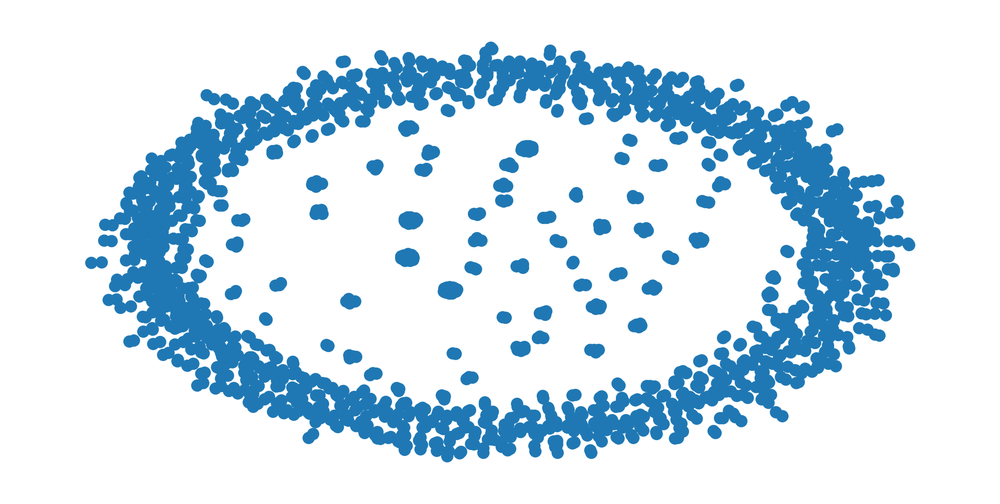

In [46]:
#credits https://www.kaggle.com/crailtap/basic-network-analysis-tutorial

#check density
print("The density of the graph is ",nx.density(graph))
# we get a very sparse(not dense) graph. Maybe if we used all the nodes then we might get a more dense graph
#too big to draw!
nx.draw(graph, pos=nx.spring_layout(graph))

## Subgraph - Stuttgart Region

In [47]:
# Extracting User Data and Creating User Network Graph from Businesses located in Stuttgart City

# Select businesses located in Stuttgart city
subset = business[business.city == 'Stuttgart']

# Perform an inner join between business data and reviews data
subset = pd.merge(subset, reviews, how='inner', on='business_id')

# Extract unique user IDs
subset_users = subset.user_id.unique()

# Create a DataFrame for user IDs
subset_users = pd.DataFrame(subset_users, columns=['user_id'])

# Perform an inner join between user IDs and the user dataset
subset_users = pd.merge(subset_users, user, how='inner', on='user_id')

# Create a list of friends for each user
subset_users['list_friends'] = subset_users["friends"].apply(lambda x: str(x).split(','))
subset_users['count_friends'] = subset_users["list_friends"].apply(lambda x: len(x))

# Check the results
subset_users.shape

(282, 24)

In [48]:
# Extracting User ID and Friends List
subset_users_list = subset_users[['user_id', 'list_friends']]

# Unstacking the Friends List into multiple rows
network_data = subset_users_list.set_index(['user_id'])['list_friends'].apply(pd.Series).stack()
network_data = network_data.reset_index()

# Modifying column names for network graph import
network_data.columns = ['source', 'level_1', 'target']

In [49]:
graph=nx.from_pandas_edgelist(network_data)
# logging time
end_time=time.time()
print("Took",end_time-start_time,"s")

Took 958.3855910301208 s


In [51]:

#check density
print("The density of the graph is ",nx.density(graph))

The density of the graph is  8.573821892400615e-05


In [52]:
#use degree-centrality to find out influencers in the selected region
x=nx.degree_centrality(graph)
#Creating a subset again as we cant handle 70k nodes, unfortunately.

#Using heapq to find the 500 most connected nodes (ie) peeple with the most connections
influencers=heapq.nlargest(500, x, key=x.get)

In [53]:
#creating a sub-graph as I'm not able to create the layout positions without killing the kernal
influencers_sub_graph=graph.subgraph(influencers)

# Check for isolates ( nodes with no edges (ie) users without friends in the sub-graph)
# graph=graph.remove_nodes_from(nx.isolates(graph))
list_of_nodes_to_be_removed=[x for x in nx.isolates(influencers_sub_graph)]

# remove the selected isolates from the main graph
graph.remove_nodes_from(list_of_nodes_to_be_removed)

In [54]:
#recreate the subgraph from the updated graph
influencers_sub_graph=graph.subgraph(influencers)

The density of the graph is  0.031207840142548047


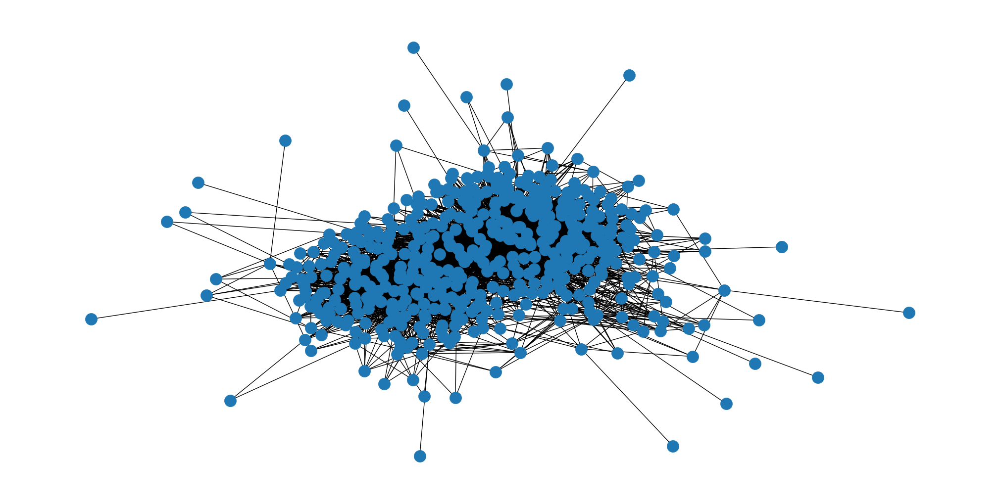

In [56]:

#check density
print("The density of the graph is ",nx.density(influencers_sub_graph))

nx.draw(influencers_sub_graph, pos=nx.spring_layout(influencers_sub_graph))

## Network Visualization

### Spring layout

In [57]:
# create the layout
pos = nx.spring_layout(influencers_sub_graph)

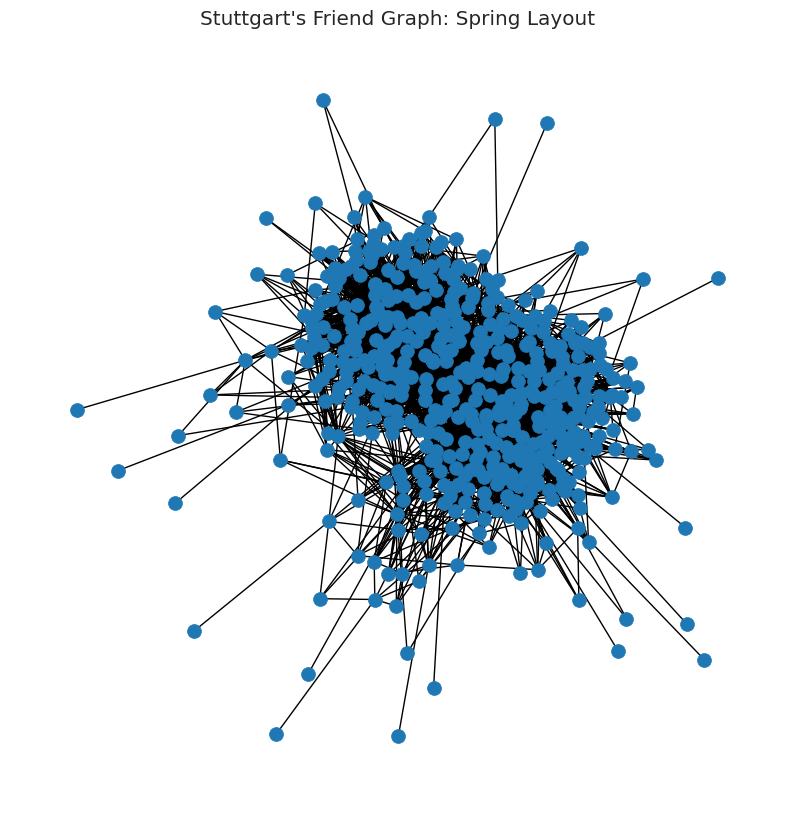

In [58]:
# Set the figure size
plt.figure(figsize=(10, 10))

# Set the title
plt.title("Stuttgart's Friend Graph: Spring Layout")

# Draw the graph using the Spring layout algorithm
nx.draw(influencers_sub_graph, pos=pos, node_size=100, width=1, with_labels=False)

# Show the plot
plt.show()


The above code shows the user communities and their connections in Stuttgart.

Let's explore other possible views in networkx:

### Circular/Circos Layout

Spring Layout
Circular/Circos Layout
Random Layout
Kamada-Kawai Layout


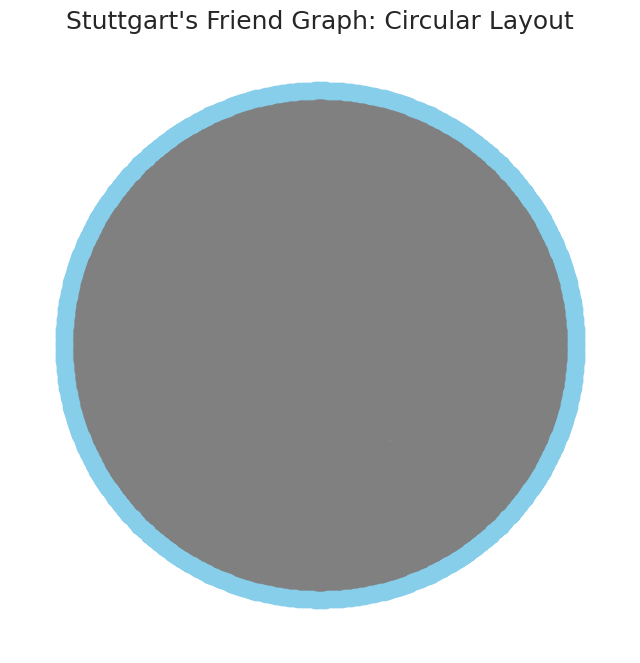

In [59]:
import matplotlib.pyplot as plt
import networkx as nx

# Set the figure size
plt.figure(figsize=(8, 8))

# Set the title
plt.title("Stuttgart's Friend Graph: Circular Layout", fontsize=18)

# Draw the graph using the Circular layout algorithm
pos = nx.circular_layout(influencers_sub_graph)
nx.draw(influencers_sub_graph, pos=pos, node_size=150, width=1.5, node_color='skyblue', edge_color='gray', with_labels=False)

# Show the plot
plt.axis('off')
plt.show()



### Random Layout

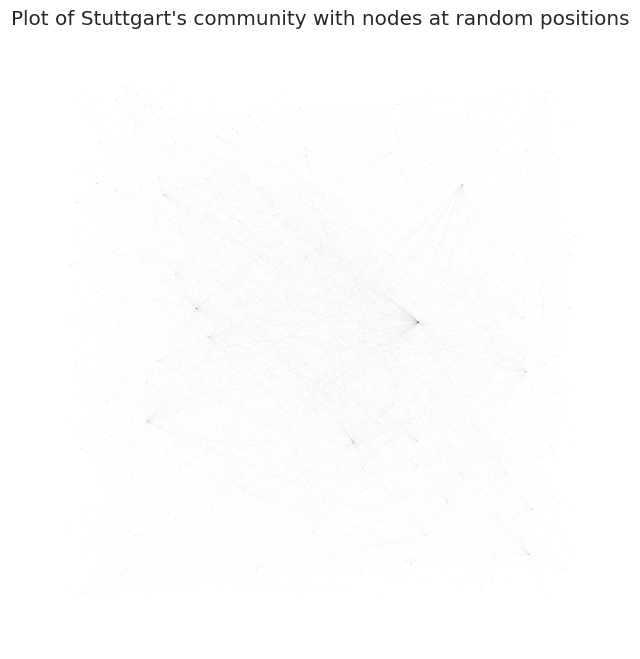

In [78]:
plt.figure(figsize=(8,8))
plt.title("Plot of Stuttgart's community with nodes at random positions")
#https://stackoverflow.com/questions/21978487/improving-python-networkx-graph-layout
nx.draw_random(influencers_sub_graph,node_size=0.001, width=0.001)

### Kamada-Kawai Layout

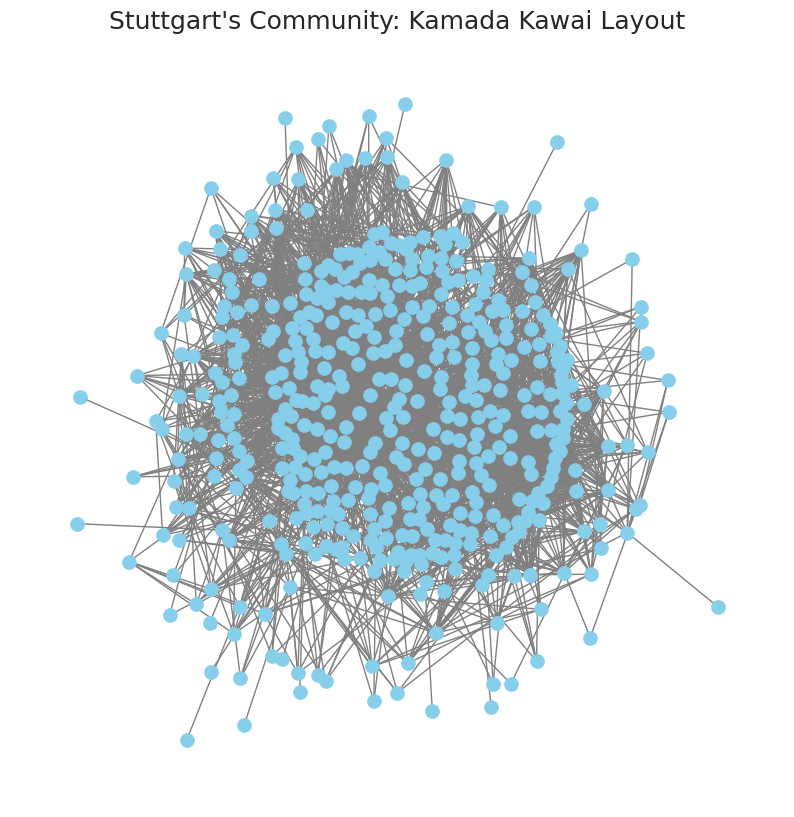

In [89]:
import matplotlib.pyplot as plt
import networkx as nx

# Set the figure size
plt.figure(figsize=(10, 10))

# Set the title and font size
plt.title("Stuttgart's Community: Kamada Kawai Layout", fontsize=18)

# Use Kamada-Kawai layout algorithm to get node positions
pos2 = nx.kamada_kawai_layout(influencers_sub_graph)

# Draw the graph with node size and width adjusted for visibility
nx.draw(influencers_sub_graph, pos=pos2, node_size=100, width=1, node_color='skyblue', edge_color='gray')

# Hide axis
plt.axis('off')

# Show the plot
plt.show()


## Community Detection

In this section, we will identify potential influential communities within the Stuttgart's Friend Network. We will apply community detection algorithms to uncover groups of nodes that are densely connected within themselves and have sparse connections to nodes outside the community. Once the communities are detected, we will overlay them on the graph using the Spring layout for better visualization and understanding of the network's structure and community relationships.

In [99]:
!pip install python-louvain

In [93]:
!pip install community

In [102]:
import networkx as nx
import community.community_louvain as louvain

# Assuming you have a networkx graph named influencers_sub_graph

parts = louvain.best_partition(influencers_sub_graph)
values = [parts.get(node) for node in influencers_sub_graph.nodes()]

print(len(set(values)), "Communities have been identified")

5 Communities have been identified


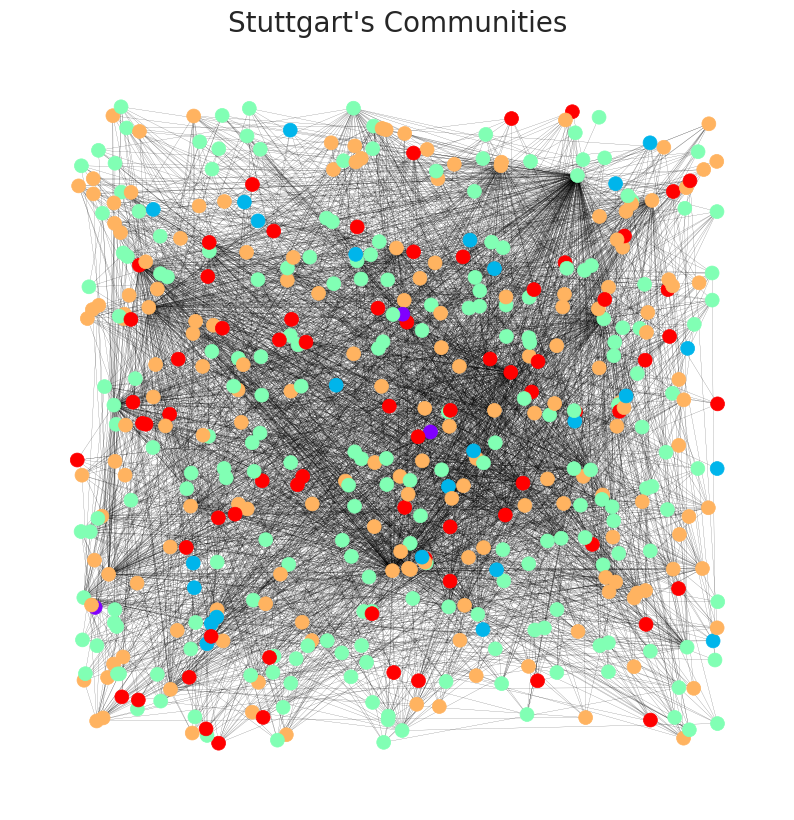

In [107]:
import matplotlib.pyplot as plt
import networkx as nx

# Set the figure size
plt.figure(figsize=(10, 10))

# Set the title and font size
plt.title("Stuttgart's Communities", fontsize=20)

# Use a colormap to set node colors based on 'values'
cmap = plt.get_cmap("rainbow")
nx.draw_networkx(influencers_sub_graph,
                 pos=pos,
                 cmap=cmap,
                 node_color=values,
                 node_size=100,
                 with_labels=False,
                 width=0.1)

# Hide axis
plt.axis('off')

# Show the plot
plt.show()


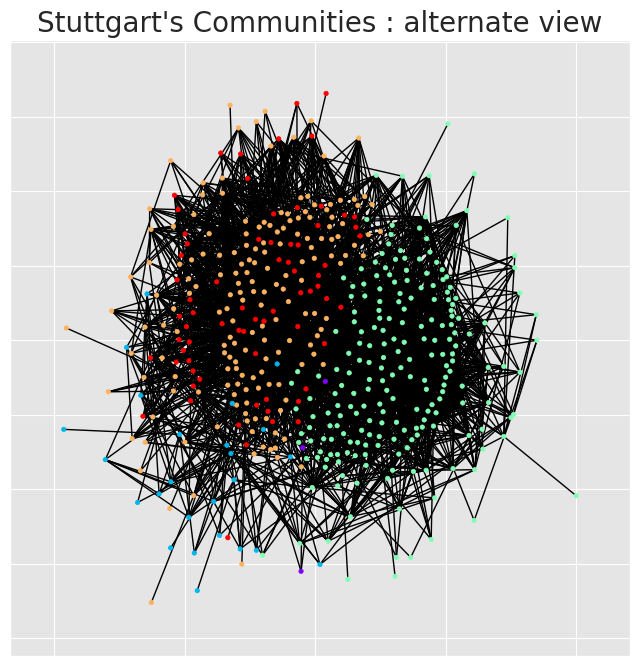

In [106]:
plt.figure(figsize=(8,8))
plt.axes=False
plt.title("Stuttgart's Communities : alternate view",fontsize=20)
nx.draw_networkx(influencers_sub_graph, pos = pos2,cmap = plt.get_cmap("rainbow"), node_color = values, node_size = 10, with_labels = False)